<a href="https://colab.research.google.com/github/BetoxAlka/AnaliticaDatos_Equipo3/blob/main/Actividad3-5-2/Act3_5_2_geneva.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#Librerías
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
#Cargar archivos csv o xlsx desde equipo
from google.colab import files
files.upload()

Saving listings.csv to listings.csv


{'listings.csv': b'id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review

In [4]:
#Carga archivo .csv sin indice
data = pd.read_csv('listings.csv')
data.head()

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,42515,https://www.airbnb.com/rooms/42515,20240629050352,2024-06-29,city scrape,Geneva center - Hosting females,NaN,NaN,https://a0.muscache.com/pictures/10640277/ff1d...,185647,...,4.84,4.85,4.54,NaN,f,1,0,1,0,0.50
1,203997,https://www.airbnb.com/rooms/203997,20240629050352,2024-06-29,city scrape,Top location studio 1 block from lake!,"Spacious studio with washer/dryer, Wi-fi, supe...",This is the most sought after area in Geneva: ...,https://a0.muscache.com/pictures/14163740/9392...,1001280,...,4.99,4.95,4.80,NaN,t,2,2,0,0,0.62
2,276025,https://www.airbnb.com/rooms/276025,20240629050352,2024-06-29,city scrape,Lovely flat by Geneva lake,This cozy flat is located in a very pleasant v...,"Versoix is a pretty fishing village, on the ed...",https://a0.muscache.com/pictures/4156456/d3aed...,1442438,...,4.89,4.77,4.70,NaN,f,1,1,0,0,0.80
3,338682,https://www.airbnb.com/rooms/338682,20240629050352,2024-06-29,previous scrape,Top location 1 block from the lake!,One bedroom apartment located in a pedestrian ...,This is the favourite area for expats in Genev...,https://a0.muscache.com/pictures/14164129/db92...,1001280,...,4.90,4.87,4.69,NaN,t,2,2,0,0,0.78
4,399388,https://www.airbnb.com/rooms/399388,20240629050352,2024-06-29,city scrape,Nice modern bedroom with balcony,Nice modern bedroom with confortable king size...,NaN,https://a0.muscache.com/pictures/hosting/Hosti...,1994454,...,4.89,4.70,4.70,NaN,f,2,0,2,0,0.36


In [5]:
#Verificamos información del DtaFrame
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2685 entries, 0 to 2684
Data columns (total 75 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   id                                            2685 non-null   int64  
 1   listing_url                                   2685 non-null   object 
 2   scrape_id                                     2685 non-null   int64  
 3   last_scraped                                  2685 non-null   object 
 4   source                                        2685 non-null   object 
 5   name                                          2685 non-null   object 
 6   description                                   2590 non-null   object 
 7   neighborhood_overview                         1146 non-null   object 
 8   picture_url                                   2685 non-null   object 
 9   host_id                                       2685 non-null   i

In [6]:
#Corroborar que no hay valores nulos
valores_nulos=data.isnull().sum()

#pd.options.display.max_rows = None
valores_nulos

,0
id,0
listing_url,0
scrape_id,0
last_scraped,0
source,0
...,...
calculated_host_listings_count,0
calculated_host_listings_count_entire_homes,0
calculated_host_listings_count_private_rooms,0
calculated_host_listings_count_shared_rooms,0


####Borrar columnas no representativas
Ya que tienen muchos valores nulos decidimos no tomar en cuenta las siguientes variables

In [20]:
pd.options.display.max_rows = None
pd.options.display.max_columns = None
data = data.drop(data[['id','scrape_id','host_picture_url','host_thumbnail_url','picture_url','host_url','listing_url','neighborhood_overview', 'host_about', 'host_neighbourhood', 'neighbourhood', 'neighbourhood_group_cleansed', 'calendar_updated',  'license']], axis=1)
data


KeyError: "None of [Index(['id', 'scrape_id', 'host_picture_url', 'host_thumbnail_url',\n       'picture_url', 'host_url', 'listing_url', 'neighborhood_overview',\n       'host_about', 'host_neighbourhood', 'neighbourhood',\n       'neighbourhood_group_cleansed', 'calendar_updated', 'license'],\n      dtype='object')] are in the [columns]"

In [8]:
#Reemplazo de datos tipo string a datos tipo numérico
data['host_response_rate']= data['host_response_rate'].str.replace('%','')
data['host_acceptance_rate']= data['host_acceptance_rate'].str.replace('%','')
data['price']= data['price'].str.replace('$','')
data['price']= data['price'].str.replace(',','')
data['price']= data['price'].str.replace('.00','')

In [9]:
#Conversión de tipo de dato de columna de tipo Object a Float
data['host_response_rate']= data['host_response_rate'].astype(float)
data['host_acceptance_rate']= data['host_acceptance_rate'].astype(float)
data['price']= data['price'].astype(float)

In [10]:
#data = [data.max(), data.min()]
#data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2685 entries, 0 to 2684
Data columns (total 61 columns):
 #   Column                                        Non-Null Count  Dtype  
---  ------                                        --------------  -----  
 0   last_scraped                                  2685 non-null   object 
 1   source                                        2685 non-null   object 
 2   name                                          2685 non-null   object 
 3   description                                   2590 non-null   object 
 4   host_id                                       2685 non-null   int64  
 5   host_name                                     2685 non-null   object 
 6   host_since                                    2685 non-null   object 
 7   host_location                                 2209 non-null   object 
 8   host_response_time                            2145 non-null   object 
 9   host_response_rate                            2145 non-null   f

In [11]:
#Crear 2 data frames por tipo para poder procesar los outliers
cuantitativas = data.iloc[:,[4,9,10,12,13,18,19,22,23,25,26,28,29,30,31,32,33,34,35,36,38,39,41,43,44,45,48,49,50,51,52,53,54,56,57,58,59,60]]
cualitativas = data.iloc[:,[0,1,2,3,5,6,7,8,11,14,15,16,17,20,21,24,27,37,42,46,47,55]]


<Figure size 1500x800 with 0 Axes>

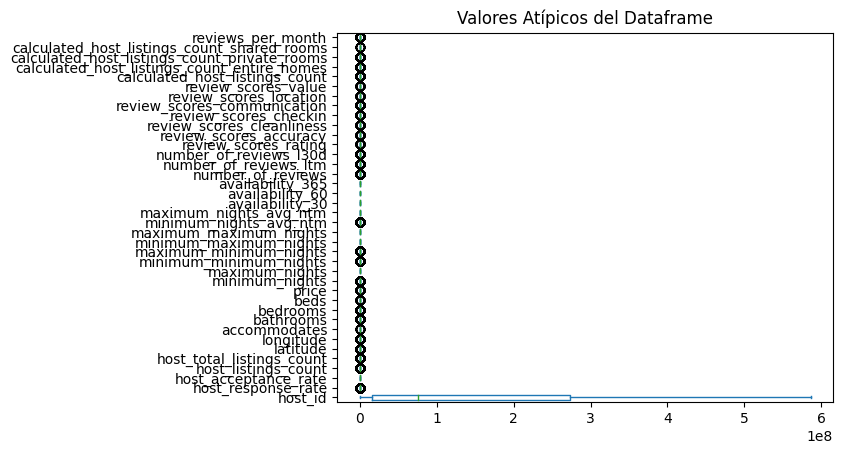

In [12]:
#Realizamos diagrama de caja o bigote de cada columna del dataframe
fig = plt.figure(figsize=(15,8))
cuantitativas.plot(kind='box', vert=False)
plt.title("Valores Atípicos del Dataframe")
plt.show() #Dibujamos el diagrama

##Procedimiento **CUANTILES** para sustituir outliers en dataframe



In [13]:
#Método aplicando Cuartiles. Encuentra cuartiles 0.25 y 0.75
y = cuantitativas

percentile25 = y.quantile(0.25) #Q1
percentile75 = y.quantile(0.75) #Q3
iqr= percentile75 - percentile25

Limite_Superior_iqr= percentile75 + 1.5*iqr
Limite_Inferior_iqr= percentile75 - 1.5*iqr
print("Límite superior permitido\n",Limite_Superior_iqr)
print('\n     ')
print("Límite inferior permitido\n",Limite_Inferior_iqr)

Límite superior permitido
 host_id              6.611397e+08
                         ...     
reviews_per_month    3.225000e+00
Length: 38, dtype: float64

     
Límite inferior permitido
 host_id             -1.136711e+08
                         ...     
reviews_per_month   -4.050000e-01
Length: 38, dtype: float64


In [14]:
#Obtenemos  datos limpios del Dataframe
data_iqr= cuantitativas[(y<=Limite_Superior_iqr)&(y>=Limite_Inferior_iqr)]
data_iqr

,host_id,host_response_rate,host_acceptance_rate,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,185647,100.0,80.0,1.0,1.0,46.20198,6.15672,1.0,NaN,1.0,1.0,89.0,3.0,1125,3.0,3.0,1125,1125,3.0,1125.0,28,58,363,NaN,7.0,2.0,4.73,4.73,4.78,4.85,4.84,4.85,4.54,1.0,NaN,1.0,0.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2684,45569864,NaN,NaN,1.0,3.0,46.21134,6.14629,2.0,1.0,1.0,1.0,150.0,4.0,365,4.0,4.0,365,365,4.0,365.0,30,60,64,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0,0.0,0.0,NaN


In [15]:
#Corroborar valores nulos del data frame LIMPIO
valores_nulos = data.isnull().sum().sum()
valores_nulos

10359

In [18]:
#Reemplazamos valores atípicos (nulos) de dataframe con "mean"
#Realizamos una copia del dataframe
data1_iqr2= data_iqr.copy()
cuantitativas= data1_iqr2.fillna(round(data_iqr.mean(), 1))
cuantitativas

,host_id,host_response_rate,host_acceptance_rate,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,185647,100.0,80.0,1.0,1.0,46.20198,6.15672,1.0,1.0,1.0,1.0,89.0,3.0,1125,3.0,3.0,1125,1125,3.0,1125.0,28,58,363,10.6,7.0,2.0,4.73,4.73,4.78,4.85,4.84,4.85,4.54,1.0,1.2,1.0,0.0,0.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2684,45569864,98.7,82.6,1.0,3.0,46.21134,6.14629,2.0,1.0,1.0,1.0,150.0,4.0,365,4.0,4.0,365,365,4.0,365.0,30,60,64,0.0,0.0,0.0,4.80,4.90,4.80,4.90,4.90,4.90,4.70,1.0,1.0,0.0,0.0,0.8


In [24]:
#Reemplazamos valores nulos cualitativos
#cualitivas = cualitativas.fillna(cualitativas.mode())

# Rellenar los valores nulos con la moda
cualitativas['description'] = cualitativas['description'].fillna(method='bfill')
#cualitativas[['host_location','host_response_time','host_is_superhost','has_availability','bathrooms_text','first_review', 'last_review']] = cualitativas[['host_location','host_response_time','host_is_superhost','has_availability','bathrooms_text','first_review', 'last_review']].fillna(cualitativas.ffill())
cualitativas= cualitativas.fillna(method='ffill')

cualitativas.isnull().sum().sum()


<ipython-input-24-976ffef118c0>:5: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  cualitativas['description'] = cualitativas['description'].fillna(method='bfill')
<ipython-input-24-976ffef118c0>:7: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  cualitativas= cualitativas.fillna(method='ffill')


0

In [25]:
#Unimos el dataframe cuantitativo limpio con el dataframe cualitativo
Datos_limpios = pd.concat([cuantitativas, cualitativas], axis=1)
Datos_limpios

,host_id,host_response_rate,host_acceptance_rate,host_listings_count,host_total_listings_count,latitude,longitude,accommodates,bathrooms,bedrooms,beds,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,availability_30,availability_60,availability_365,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month,last_scraped,source,name,description,host_name,host_since,host_location,host_response_time,host_is_superhost,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,property_type,room_type,bathrooms_text,amenities,has_availability,calendar_last_scraped,first_review,last_review,instant_bookable
0,185647,100.0,80.0,1.0,1.0,46.201980,6.156720,1.0,1.0,1.0,1.0,89.0,3.0,1125,3.0,3.0,1125,1125,3.0,1125.0,28,58,363,10.6,7.0,2.0,4.73,4.73,4.78,4.85,4.84,4.85,4.54,1.0,1.2,1.0,0.0,0.50,2024-06-29,city scrape,Geneva center - Hosting females,"Spacious studio with washer/dryer, Wi-fi, supe...",Noelle,2010-07-30,"Geneva, Switzerland",within a few hours,f,"['email', 'phone']",t,t,Commune de Genève,Private room in rental unit,Private room,1.5 shared baths,"[""TV with standard cable"", ""Dryer"", ""Cooking b...",t,2024-06-29,2011-09-24,2024-06-14,f
1,1001280,100.0,100.0,6.0,12.0,46.199640,6.155800,2.0,1.0,1.0,1.4,165.0,5.0,730,5.0,5.0,1125,1125,5.0,1125.0,1,1,17,10.6,8.0,1.0,4.91,4.98,4.89,4.97,4.99,4.95,4.80,2.0,2.0,0.0,0.0,0.62,2024-06-29,city scrape,Top location studio 1 block from lake!,"Spacious studio with washer/dryer, Wi-fi, supe...",Mike,2011-08-21,"Geneva, Switzerland",within an hour,t,"['email', 'phone']",t,t,Commune de Genève,Entire rental unit,Entire home/apt,1 bath,"[""TV with standard cable"", ""Hangers"", ""Microwa...",t,2024-06-29,2012-11-11,2024-05-31,t
2,1442438,100.0,100.0,2.0,2.0,46.200000,6.168330,3.0,1.0,1.0,1.4,78.0,7.0,360,4.0,7.0,1125,1125,7.0,1125.0,0,16,298,10.6,4.0,0.0,4.63,4.69,4.74,4.88,4.89,4.77,4.70,1.0,1.0,0.0,0.0,0.80,2024-06-29,city scrape,Lovely flat by Geneva lake,This cozy flat is located in a very pleasant v...,Gaby,2011-11-25,"Geneva, Switzerland",within an hour,f,"['email', 'phone']",t,t,Versoix,Entire rental unit,Entire home/apt,1 bath,"[""Free dryer \u2013 In building"", ""Hangers"", ""...",t,2024-06-29,2012-03-15,2024-05-26,f
3,1001280,100.0,100.0,6.0,12.0,46.207080,6.155450,2.0,1.0,1.0,1.4,122.2,5.0,365,5.0,5.0,1125,1125,5.0,1125.0,2,4,5,10.6,2.0,0.0,4.81,4.85,4.77,4.90,4.90,4.87,4.69,2.0,2.0,0.0,0.0,0.78,2024-06-29,previous scrape,Top location 1 block from the lake!,One bedroom apartment located in a pedestrian ...,Mike,2011-08-21,"Geneva, Switzerland",within an hour,t,"['email', 'phone']",t,t,Commune de Genève,Entire rental unit,Entire home/apt,1.5 baths,"[""40 inch HDTV with standard cable"", ""Dedicate...",t,2024-06-29,2012-03-02,2024-04-16,t
4,1994454,90.0,71.0,2.0,3.0,46.189040,6.139080,2.0,1.0,1.0,1.0,54.0,2.0,1125,2.0,2.0,1125,1125,2.0,1125.0,0,27,90,53.0,5.0,0.0,4.84,4.79,4.87,4.94,4.89,4.70,4.70,2.0,1.2,2.0,0.0,0.36,2024-06-29,city scrape,Nice modern bedroom with balcony,Nice modern bedroom with confortable king size...,Oscar,2012-03-23,"Geneva, Switzerland",within an hour,f,"['email', 'phone', 'work_email']",t,t,Commune de Genève,Private room in rental unit,Private room,1 shared bath,"[""Mountain view"", ""Hangers"", ""Single level hom...",t,2024-06-29,2012-07-15,2024-05-16,f
5,2086993,100.0,98.0,2.0,2.0,46.199500,6.173080,2.0,1.0,1.0,1.0,90.0,2.0,14,2.0,2.0,1125,1125,2.0,1125.0,15,45,75,10.6,17.0,1.0,4.94,4.98,5.00,4.99,4.99,4.86,4.91,2.0,1.0,1.0,0.0,0.60,2024-06-29,city scrape,Beautiful Apm

In [26]:
#Corroborar que no hay valores nulos
pd.options.display.max_rows = None
valores_nulos=Datos_limpios.isnull().sum().sum()
valores_nulos

0

In [27]:
Datos_limpios.to_csv("geneva_listings_clean.csv")